# DataDiVR | GO TERMS 

In [669]:
from multidimvis_main import *

In [670]:
G = nx.read_edgelist('input/ppi_elist.txt',data=False)

d_gene_do = pickle.load( open( "input/d_gene_do.pkl", "rb" ) )
d_do_genes = pickle.load( open( "input/d_do_genes.pkl", "rb" ) )
d_do_names = pickle.load( open( "input/DO_names.pkl", "rb" ) )
d_names_do = {y:x for x,y in d_do_names.items()}

In [ ]:
# precalculated import
df_centralities = pd.read_csv('output_csv/Features_centralities_Dataframe_Human.csv', index_col=0)

d_deghubs = dict(zip(G.nodes(),df_centralities['degs']))
d_clos = dict(zip(G.nodes(), df_centralities['clos']))
d_betw = dict(zip(G.nodes(), df_centralities['betw']))
d_eigen = dict(zip(G.nodes(), df_centralities['eigen']))

### GENE ID to SYN (e.g. HOVERINFO for nodes)

In [678]:
entrez_syn = pd.read_csv('input/entrezid_syn.csv', index_col=0)
d_entrez_syn = dict(zip(entrez_syn.index,entrez_syn['db_synonym']))

d_gene2syn = {}
for k,v in d_entrez_syn.items():
    try:
        if k in G.nodes():
            d_gene2syn[k] = v
    except: 
           d_gene2syn['None'] = 'no entry'
            
d_genes_withsyn = {}
for g in G.nodes():
    for k,v in d_gene2syn.items():
        if g == k:
            d_genes_withsyn[g] = v
            
d_genes_nosyn = {}
for gene in G.nodes():
    if gene not in d_genes_withsyn.keys():
        d_genes_nosyn[gene] = 'no entry'
        
d_genes_all = {**d_genes_withsyn, **d_genes_nosyn}
d_genes_syn_sorted = {key:d_genes_all[key] for key in G.nodes()}

l_genes_syn=[]
for k,v in d_genes_syn_sorted.items():
    try:
        l_genes_syn.append(set(v.split('|')))
    except:
        l_genes_syn.append(v)
        
d_genes_syn_complete = {}
for i,v in enumerate(d_genes_syn_sorted.keys()):
    for idx,l in enumerate(l_genes_syn):
        if i==idx:
            d_genes_syn_complete[v] = l
            
l_features = list(zip(d_genes_syn_complete.keys(),d_genes_syn_complete.values()))

## GO : CELLULAR COMPONENT 

In [1129]:
feature = 'CC'

f_CC = pd.read_csv('input/felix/ppi_layout_5_cell.csv',index_col=0, header=None, names = ['X','Y','Z','r','g','b'])

# old : f_gene2nice_cc = pickle.load( open( "input/felix/gene2NICEgoCids_r08.pkl", "rb" ) )
# new : 
go_CC_geneid = pickle.load( open( "input/celine/d_go2ent_incUpstream_cellcomp_s20200707.pkl", "rb" ) )


#DM_CC = pd.read_csv('output_csv/DistanceMatrix_goCC_Dataframe_Human.csv', index_col=0)

In [1084]:
'''# get all GO-terms

l_all_goids = []
for v in f_gene2nice_cc.values():
    for each in v:
        l_all_goids.append(each)

all_goids = set(l_all_goids)

# get GO-TERM to GENES 

d_CC_goid_genes = {}
for i in all_goids:
    sub = []
    for k,v in f_gene2nice_cc.items():
        if i in v:
            sub.append(k)
    d_CC_goid_genes[i] = sub'''

In [1085]:
# get precalculated COORDINATES (FELIX LAYOUT > DATADiVR) 

f_CC_genes = []
for i in list(f_CC.index):
    f_CC_genes.append(str(i))
    
f_CC_x = f_CC['X']
f_CC_y = f_CC['Y']
f_CC_z = f_CC['Z']

posG_CC = dict(zip(f_CC_genes,zip(f_CC_x,f_CC_y, f_CC_z)))
posG_CC_sorted = {key: posG_CC[key] for key in G.nodes()}

posG = posG_CC_sorted

#### SEARCH FOR CC GO-TERM

In [1086]:
# ----------------------------------------------------        
# search specific term + count of genes associated with GO term
# ----------------------------------------------------   
min_genes = 30 
max_genes = 70
min_dens = 0.5

for g,n in d_CC_goid_genes.items():
    G_sub = G.subgraph(n)
    dens = nx.density(G_sub)
    if dens >= min_dens and len(n) >= min_genes and len(n) <= max_genes:
            print('GO-term:',g, '| Number of genes:',len(n), '| Density: ', round(dens,2),'%')

GO-term: GO:0000502 | Number of genes: 50 | Density:  0.68 %
GO-term: GO:0016592 | Number of genes: 33 | Density:  0.64 %
GO-term: GO:0022627 | Number of genes: 46 | Density:  0.51 %


In [1106]:
# ALL TESTED:
#goterm = 'GO:0070847' # Voltage-gated potassium channel complex variant 2 / GINS komplex
#goterm = 'GO:0098556' # Voltage-gated potassium channel complex variant 2 / GINS komplex
#goterm = 'GO:0098554' # Tyrosine-protein phosphatase non-receptor type 1
#goterm = 'GO:0044611' # Voltage-gated potassium channel complex variant 2 / GINS komplex
#goterm = 'GO:0000438' # Voltage-gated potassium channel complex variant 2 / GINS komplex
#goterm = 'GO:0036488' # Voltage-gated potassium channel complex variant 2 / GINS komplex
#goterm = 'GO:0036502' # Voltage-gated potassium channel complex variant 2 / GINS komplex
#goterm = 'GO:0098556' # GINS complex
#goterm = 'GO:1990071' # GTP binding protein
goterm = 'GO:0000502' # Core TFIIH complex portion of holo TFIIH complex

# MOST CONDENSED: 
#goterm = 'GO:1990111' # Voltage-gated potassium channel complex variant 2
#goname = 'Voltage-gated potassium channel complex variant 2 / GINS komplex'

In [1107]:
l_genes = d_CC_goid_genes[goterm]

#### LAYOUT ANNOTATIONS 

In [1108]:
# get centerpoint of selected GO-term 

d_spec_genes_coords = {}
for i in l_genes:
    for k,v in posG.items():
        if k==i:
            d_spec_genes_coords[i] = v
            
posG_spec = d_spec_genes_coords


x=[]
y=[]
z=[]
for i in posG_spec.values():
    x.append(i[0])
    y.append(i[1])
    z.append(i[2])

centroid = (sum(x) / len(posG_spec.values()), sum(y) / len(posG_spec.values()),  sum(z) / len(posG_spec.values()))

# ANNOTATION of specific GO-TERM 

annotations = [dict(
                x=centroid[0],
                y=centroid[1],
                z=centroid[2],
                
                #x=posG['5720'][0], # NFKB1 based on manual inspection where to best set the annotation
                #y=posG['5720'][1],
                #z=posG['5720'][2],
    
                showarrow=True,
                text=goname+' | '+goterm,
                xanchor="right",
                ay=-100,
                ax=-100,
                opacity=0.8,
                arrowhead=0,
                arrowwidth=0.5,
                arrowcolor="white"
                )]

____________
# PRE-SETTINGS
____________

### NODE SIZE

In [1109]:
size3d = 3

scalef= 0.01
#size3d = draw_node_degree(G, scalef)

### COLOUR PARAMETERS + 3D ANNOTATIONS

+ COLOR SPECIFIC GENES (LIST)

In [1110]:
colour = 'rgba(176, 255, 31, 1)'

colours = color_nodes_from_genelist(G, l_genes, colour)

+ COLOR EDGES BASED ON GENE LIST

In [1111]:
d_edge_col = color_edges_from_genelist(G, l_genes, colour)
edge_color = 3*list(d_edge_col.values())

________
### 3D tSNE

In [1112]:
tsne_nodes = get_trace_nodes(G, posG, l_features, colours, size3d)

In [1113]:
tsne_edges = get_trace_edges_from_genelist(list(d_edge_col.keys()), posG, edge_color)

In [1114]:
tsne_data = [tsne_edges, tsne_nodes]
#tsne_data = [tsne_nodes, trace_centers]
#tsne_data = [tsne_nodes]

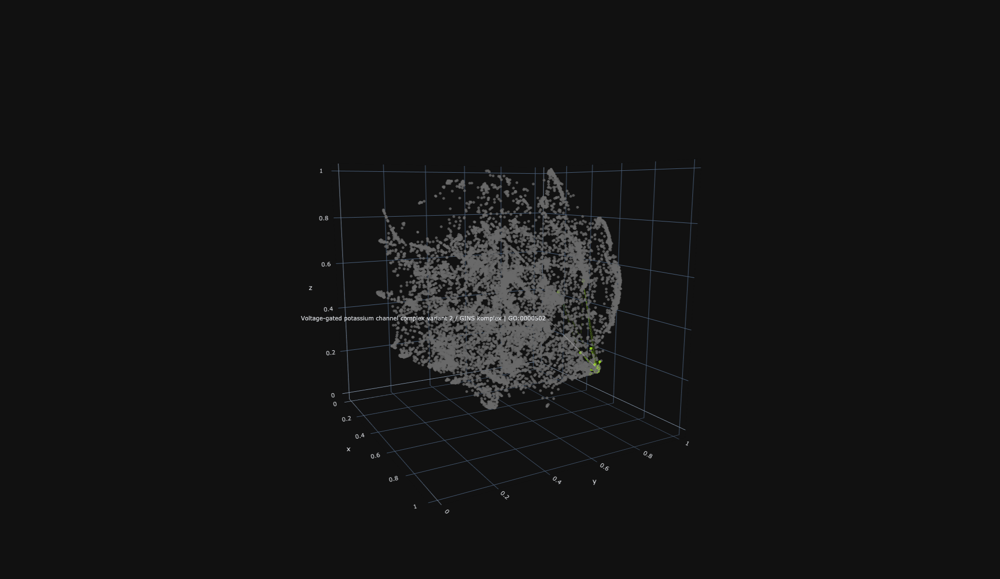

'output_plots/3Dportrait_tsne_CC_GO:0000502_Human.html'

In [1115]:
fig = pgo.Figure()
for i in tsne_data:
    fig.add_trace(i)
fig.update_layout(template='plotly_dark', showlegend=False, width=1200, height=1200,
                  scene=dict(
                    aspectratio=dict(
                        x=1,
                        y=1,
                        z=1
                    ),
                    camera=dict(
                        center=dict(
                            x=0,
                            y=0,
                            z=0
                        ),
                        eye=dict(
                            x=1.96903462608,
                            y=-1.09022831971,
                            z=0.405345349304
                        ),
                        up=dict(
                            x=0,
                            y=0,
                            z=1
                        )
                    ),
                    dragmode="turntable",
                    annotations=annotations,
                ))
py.iplot(fig)

plotly.offline.plot(fig, filename = 'output_plots/3Dportrait_tsne_'+feature+'_'+goterm+'_Human.html', auto_open=False)

## GO : BIOLOGICAL PROCESS

In [846]:



#DM_BP = pd.read_csv('output_csv/DistanceMatrix_goBP_Dataframe_Human.csv', index_col=0)

### GO : MOLECULAR FUNCTION

In [836]:



#DM_MF = pd.read_csv('output_csv/DistanceMatrix_goMF_Dataframe_Human.csv', index_col=0)

_______

In [50]:
feature = 'BP'
DM = DM_BP
l_genes = list(DM_BP.index)
l_features = l_genes

In [51]:
%%time 
tsne = embed_tsne_3D(DM,  prplxty3d, density3d, l_rate3d, steps3d, metric)

CPU times: user 58min 12s, sys: 50 s, total: 59min 2s
Wall time: 54min 17s


In [52]:
%%time 
posG = get_posG_3D_(l_genes, tsne)

df_xyz_portrait_tsne = pd.DataFrame(posG, index=["x","y","z"]).T
df_xyz_portrait_tsne.to_csv(r'output_csv/3Dportrait_tsne_XYZ_'+feature+'_Human.csv', index = True)

CPU times: user 848 ms, sys: 153 ms, total: 1 s
Wall time: 1.23 s


In [20]:
scalef= 5
d_node_size = d_deghubs
size3d = draw_node_size(G, d_node_size, scalef)

edge_color = 'grey'
edge_width = 0.1

opacity_nodes = 1
opacity_edges = 0.3

### CLUSTER

In [21]:
df_posG = pd.DataFrame(posG).T

n_clus = 10
n_iterations = 50

d_node_clusterid = get_node_clusterid(df_posG, n_clus, n_iterations)
cluster_center_x, cluster_center_y, cluster_center_z = get_clustercenter_xyz(df_posG, n_clus, n_iterations)

colours = color_nodes_from_dict(G, d_node_clusterid)

trace_centers = pgo.Scatter3d(x = cluster_center_x,
                             y = cluster_center_y,
                             z = cluster_center_z,
                                 mode = 'markers',
                                 marker=dict(
                                    size=3,
                                    color='lightgrey',
                                    opacity=1)
                                 )

annotations = [dict(
                x=xi,
                y=yi,
                z=zi,
                showarrow=True,
                text="Cluster: "+str(i),
                xanchor="right",
                ay=-100,
                ax=-100,
                opacity=0.8,
                arrowhead=0,
                arrowwidth=0.5,
                arrowcolor="white"
                ) for i, xi, yi, zi in zip(range(1,n_clus+1), cluster_center_x,cluster_center_y,cluster_center_z)]

In [22]:
tsne_nodes = get_trace_nodes_(posG, l_features, colours, size3d)

# tsne_data = [tsne_edges, tsne_nodes]
# tsne_data = [tsne_nodes, trace_centers]


tsne_data = [tsne_nodes]

Perplexity: 50
Early Exaggeration: 1.2
Learning rate: 200
Iterations: 250


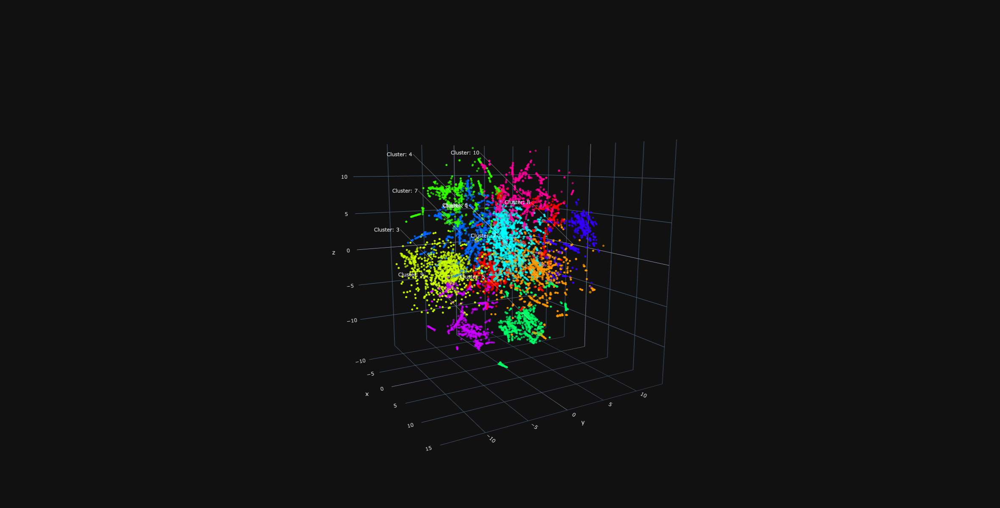

'output_plots/3Dportrait_tsne_BP_correlation_Human.html'

In [23]:
print('Perplexity:', prplxty3d)
print('Early Exaggeration:', density3d)
print('Learning rate:', l_rate3d)
print('Iterations:', steps3d)

fig = pgo.Figure()
for i in tsne_data:
    fig.add_trace(i)
fig.update_layout(template='plotly_dark', showlegend=False, width=1200, height=1200,
                  scene=dict(
                    aspectratio=dict(
                        x=1,
                        y=1,
                        z=1
                    ),
                    camera=dict(
                        center=dict(
                            x=0,
                            y=0,
                            z=0
                        ),
                        eye=dict(
                            x=1.96903462608,
                            y=-1.09022831971,
                            z=0.405345349304
                        ),
                        up=dict(
                            x=0,
                            y=0,
                            z=1
                        )
                    ),
                    dragmode="turntable",
                    annotations=annotations,
                ))
py.iplot(fig)

plotly.offline.plot(fig, filename = 'output_plots/3Dportrait_tsne_'+feature+'_'+metric+'_Human.html', auto_open=False)

_________

In [54]:
feature = 'MF'
DM = DM_MF
l_genes = list(DM_MF.index)
l_features = l_genes

In [ ]:
%%time 
tsne = embed_tsne_3D(DM,  prplxty3d, density3d, l_rate3d, steps3d, metric)

In [ ]:
%%time 
posG = get_posG_3D_(l_genes, tsne)

df_xyz_portrait_tsne = pd.DataFrame(posG, index=["x","y","z"]).T
df_xyz_portrait_tsne.to_csv(r'output_csv/3Dportrait_tsne_XYZ_'+feature+'_Human.csv', index = True)

In [27]:
scalef= 5
d_node_size = d_deghubs
size3d = draw_node_size(G, d_node_size, scalef)

edge_color = 'grey'
edge_width = 0.1

opacity_nodes = 1
opacity_edges = 0.3

### CLUSTER

In [28]:
df_posG = pd.DataFrame(posG).T

n_clus = 10
n_iterations = 50

d_node_clusterid = get_node_clusterid(df_posG, n_clus, n_iterations)
cluster_center_x, cluster_center_y, cluster_center_z = get_clustercenter_xyz(df_posG, n_clus, n_iterations)

colours = color_nodes_from_dict(G, d_node_clusterid)

trace_centers = pgo.Scatter3d(x = cluster_center_x,
                             y = cluster_center_y,
                             z = cluster_center_z,
                                 mode = 'markers',
                                 marker=dict(
                                    size=3,
                                    color='lightgrey',
                                    opacity=1)
                                 )

annotations = [dict(
                x=xi,
                y=yi,
                z=zi,
                showarrow=True,
                text="Cluster: "+str(i),
                xanchor="right",
                ay=-100,
                ax=-100,
                opacity=0.8,
                arrowhead=0,
                arrowwidth=0.5,
                arrowcolor="white"
                ) for i, xi, yi, zi in zip(range(1,n_clus+1), cluster_center_x,cluster_center_y,cluster_center_z)]

In [29]:
tsne_nodes = get_trace_nodes_(posG, l_features, colours, size3d)

# tsne_data = [tsne_edges, tsne_nodes]
# tsne_data = [tsne_nodes, trace_centers]


tsne_data = [tsne_nodes]

Perplexity: 50
Early Exaggeration: 1.2
Learning rate: 200
Iterations: 250


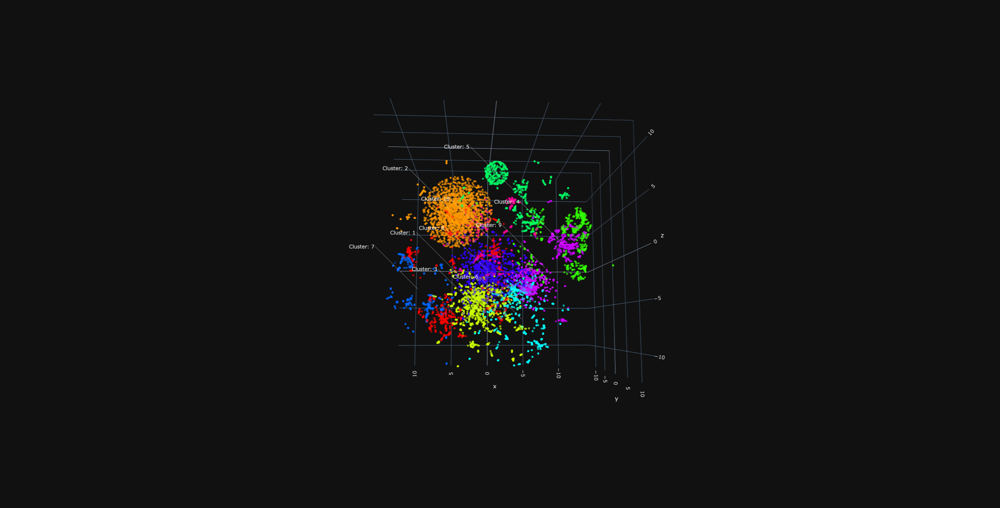

'output_plots/3Dportrait_tsne_MF_correlation_Human.html'

In [30]:
print('Perplexity:', prplxty3d)
print('Early Exaggeration:', density3d)
print('Learning rate:', l_rate3d)
print('Iterations:', steps3d)

fig = pgo.Figure()
for i in tsne_data:
    fig.add_trace(i)
fig.update_layout(template='plotly_dark', showlegend=False, width=1200, height=1200,
                  scene=dict(
                    aspectratio=dict(
                        x=1,
                        y=1,
                        z=1
                    ),
                    camera=dict(
                        center=dict(
                            x=0,
                            y=0,
                            z=0
                        ),
                        eye=dict(
                            x=1.96903462608,
                            y=-1.09022831971,
                            z=0.405345349304
                        ),
                        up=dict(
                            x=0,
                            y=0,
                            z=1
                        )
                    ),
                    dragmode="turntable",
                    annotations=annotations,
                ))
py.iplot(fig)

plotly.offline.plot(fig, filename = 'output_plots/3Dportrait_tsne_'+feature+'_'+metric+'_Human.html', auto_open=False)

# ADDITIONAL STUFF

#### COLORS FROM FELIX IMPORT

In [369]:
f_CC_genes = []
for i in list(f_CC.index):
    f_CC_genes.append(str(i))
    
f_CC_r = f_CC['r']
f_CC_g = f_CC['g']
f_CC_b = f_CC['b']

d_colours = dict(zip(f_CC_genes,zip(f_CC_r,f_CC_g, f_CC_b)))
d_colours_sorted = {key: d_colours[key] for key in G.nodes()}

colours = list(d_colours_sorted.values())

#### CLUSTER

In [14]:
df_posG = pd.DataFrame(posG).T

n_clus = 10
n_iterations = 50

d_node_clusterid = get_node_clusterid(df_posG, n_clus, n_iterations)
cluster_center_x, cluster_center_y, cluster_center_z = get_clustercenter_xyz(df_posG, n_clus, n_iterations)

colours = color_nodes_from_dict(G, d_node_clusterid)

trace_centers = pgo.Scatter3d(x = cluster_center_x,
                             y = cluster_center_y,
                             z = cluster_center_z,
                                 mode = 'markers',
                                 marker=dict(
                                    size=3,
                                    color='lightgrey',
                                    opacity=1)
                                 )

annotations = [dict(
                x=xi,
                y=yi,
                z=zi,
                showarrow=True,
                text="Cluster: "+str(i),
                xanchor="right",
                ay=-100,
                ax=-100,
                opacity=0.8,
                arrowhead=0,
                arrowwidth=0.5,
                arrowcolor="white"
                ) for i, xi, yi, zi in zip(range(1,n_clus+1), cluster_center_x,cluster_center_y,cluster_center_z)]